# Sentiment Analysis with Hugging Face

Hugging Face is an open-source and platform provider of machine learning technologies.

In this project, we will fine-tune pre-trained Deep Learning models from HuggingFace on a new dataset to adapt the models to the task that we want to solve, i.e the prediction of the sentiment expressed in a Tweet (e.g: neutral, positive, negative), then create an app to use the models and deploy the app on the HuggingFace platform.

## Application of Hugging Face Text classification model Fune-tuning

Find below a simple example, with just `3 epochs of fine-tuning`.

Read more about the fine-tuning concept : [here](https://deeplizard.com/learn/video/5T-iXNNiwIs#:~:text=Fine%2Dtuning%20is%20a%20way,perform%20a%20second%20similar%20task.)

In [1]:
!pip install datasets

In [2]:
!pip install transformers

In [3]:
import os   # provides a way to interact with the operating system, accessing files and directories
import pandas as pd
from datasets import load_dataset  # this function is used to load a dataset for further processing and analysis
from sklearn.model_selection import train_test_split #

In [4]:
# Disabe W&B
os.environ["WANDB_DISABLED"] = "true"

#This code will stop any subsequent code that relies on W&B will not use Weights & Biases

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# BASIC EDA

**1.0 Reading into our dataset**

In [6]:
# Load the dataset and display some values
df = pd.read_csv('/content/drive/MyDrive/data/Train.csv')

**1.1 Look into our df**

In [7]:
df.head()

,tweet_id,safe_text,label,agreement
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.0
1,E3303EME,I'm 100% thinking of devoting my career to pro...,1.0,1.0
2,M4IVFSMS,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,1.0
3,1DR6ROZ4,I mean if they immunize my kid with something ...,-1.0,1.0
4,J77ENIIE,Thanks to <user> Catch me performing at La Nui...,0.0,1.0


**1.2 Check and sort for missing values**

In [8]:
df.isna().sum()

tweet_id     0
safe_text    0
label        1
agreement    2
dtype: int64

In [9]:
# Sort for missing values
df = df[~df.isna().any(axis=1)]

In [10]:
# Check if changes have taken effect
df.isna().sum()

tweet_id     0
safe_text    0
label        0
agreement    0
dtype: int64

# EDA ANALYSIS

In [11]:
df.head(3)

,tweet_id,safe_text,label,agreement
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.0
1,E3303EME,I'm 100% thinking of devoting my career to pro...,1.0,1.0
2,M4IVFSMS,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,1.0


**2.0 Check distribution of the labels**

In [12]:
import plotly.express as px

# Calculate the value counts and sort by index
label_counts = df['label'].value_counts().sort_index()

# Create the bar chart using Plotly Express
fig = px.bar(
    x=label_counts.index,  # X-axis: sentiment labels
    y=label_counts.values,  # Y-axis: count of each sentiment label
    title="Plotting the Average Sentiments on Our Dataset"
)

# Show the plot
fig.show()


In [13]:
4053 + 4908 + 1038

9999

In [14]:
label_counts = pd.DataFrame(df['label'].value_counts().sort_index())

label_counts['percentage'] = label_counts['label']/9999 * 100

label_counts

,label,percentage
-1.0,1038,10.381038
0.0,4908,49.084908
1.0,4053,40.534053


In [15]:
# # Calculate the value counts and sort by index
# label_counts = label_counts['percentage'].value_counts().sort_index()

# # Create the pie chart using Plotly Express
# fig = px.pie(
#     values=label_counts.values,  # Values: count of each sentiment label
#     names=label_counts.index,  # Names: sentiment labels
#     title="Plotting the Average Sentiments on Our Dataset"
# )

# # Show the plot
# fig.show()

**2.0 Cleaning of safetext column**

In [16]:
df.head()

,tweet_id,safe_text,label,agreement
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.0
1,E3303EME,I'm 100% thinking of devoting my career to pro...,1.0,1.0
2,M4IVFSMS,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,1.0
3,1DR6ROZ4,I mean if they immunize my kid with something ...,-1.0,1.0
4,J77ENIIE,Thanks to <user> Catch me performing at La Nui...,0.0,1.0


In [17]:
df['safe_text']

0        Me &amp; The Big Homie meanboy3000 #MEANBOY #M...
1        I'm 100% thinking of devoting my career to pro...
2        #whatcausesautism VACCINES, DO NOT VACCINATE Y...
3        I mean if they immunize my kid with something ...
4        Thanks to <user> Catch me performing at La Nui...
                               ...                        
9996     Living in a time where the sperm I used to was...
9997     <user> <user>  In spite of all measles outbrea...
9998     Interesting trends in child immunization in Ok...
9999     CDC Says Measles Are At Highest Levels In Deca...
10000    Pneumonia vaccine: for women w risk of pulmona...
Name: safe_text, Length: 9999, dtype: object

**2.1 Display the safe_text column as a bid giant sentence to see observable patterns , trends etc**

In [18]:
# Display as one big sentence
giant_sentence = ' '.join(df['safe_text'].astype(str))

print(giant_sentence)


Me &amp; The Big Homie meanboy3000 #MEANBOY #MB #MBS #MMR #STEGMANLIFE @ Stegman St. <url> I'm 100% thinking of devoting my career to proving autism isn't caused by vaccines due to the IDIOTIC posts I've seen about World Autism Day #whatcausesautism VACCINES, DO NOT VACCINATE YOUR CHILD I mean if they immunize my kid with something that won't secretly kill him years down the line then I'm all for it, but I don't trust that Thanks to <user> Catch me performing at La Nuit NYC 1134 1st ave. Show starts at 6! #jennifair #mmr… <url> <user> a nearly 67 year old study when mental health studies and vaccines were relatively in their infancies that has been refuted? Study of more than 95,000 kids finds no link between MMR vaccine and autism <url> psa: VACCINATE YOUR FUCKING KIDS Coughing extra on the shuttle and everyone thinks I have the measles. 😂 #VaccinateYourKids AIDS vaccine created at Oregon Health &amp; Science University may clear virus from body - <url> <url> <user> @ this point I hav

**Observations**

1.   There are emojis within the text, These emojis tell about the general mood
     of the text.
2.   Since we are seeking to understand whether the user sentiment on covid
     vaccine is +ve , neutral or -ve. We have found out that within the texts there are texts on **other vaccines and immunizations of different illnesses**

3.  There are characters and punctuation marks not relevant to our     analysis       eg dots , These ones we shall remove

4. Within still in our safe_text column , we are having dats and time e.g Jan
   12-14, 5-8pm .
   Depending on their importance we will decide whether to keep or remove these for analysis
5. We are having characters enclosed in this < >,
   Most of which are <user>, <url> , <links>.

   Since they do not carry alot of heavy meaning to our sentence we shall remove them in our analysis
6. There are words beginning with # Which describe a topic or a general feeling
   or even  a mood of a statement.

  Although these statements not always describe the mood of a statement we will not remove them
7. Keep all the numerical characters that end with %, Since they are found to
   be engaing in a vaccine, immunization , disease related to our interested topic.  

8. There are words within our statement e.g FUCKING !, IDIOTS ! That generally
   describe a negative attitude towards our statemnt, **BUT** is a positive sentiment to the Covid Vaccine conversation.


In [19]:
import matplotlib.pyplot as plt


**2.2 Use Word Cloud to see most appearing texts in the safe_text column**

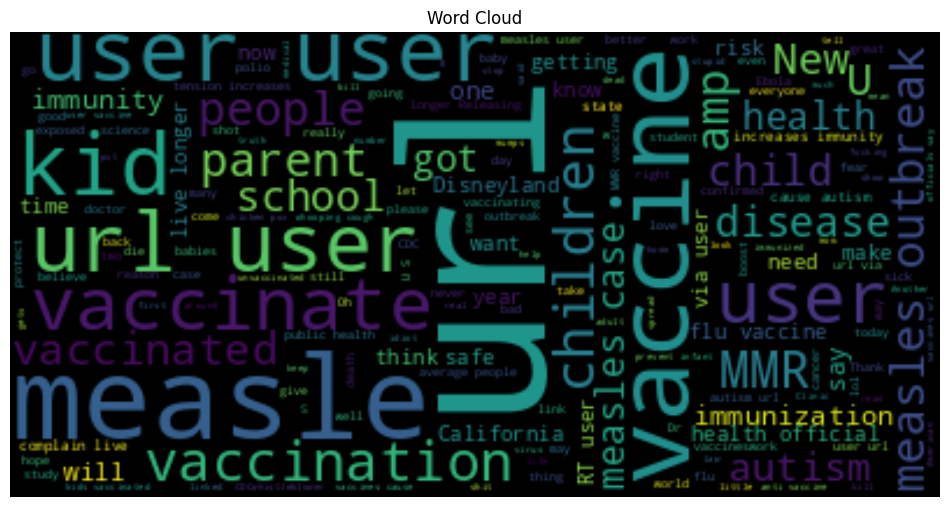

In [20]:
from wordcloud import WordCloud

# Create a WordCloud from the text data
wordcloud = WordCloud().generate(giant_sentence)

# Visualize the WordCloud
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud')
plt.show()

**NB**

Since our safe_text column had already been tagged as either positive , negative and neutral. We want to use the word cloud on separate columns to see which words are classified as already classified

**2.2 Create separete df's with the separate feelings**

**Then Visualize most common words**

In [21]:
df['label'].value_counts()

 0.0    4908
 1.0    4053
-1.0    1038
Name: label, dtype: int64

In [22]:
neutral = df[df['label']==0.0]
positive = df[df['label']==1.0]
negatiev = df[df['label']==-1.0]

In [23]:
# negative

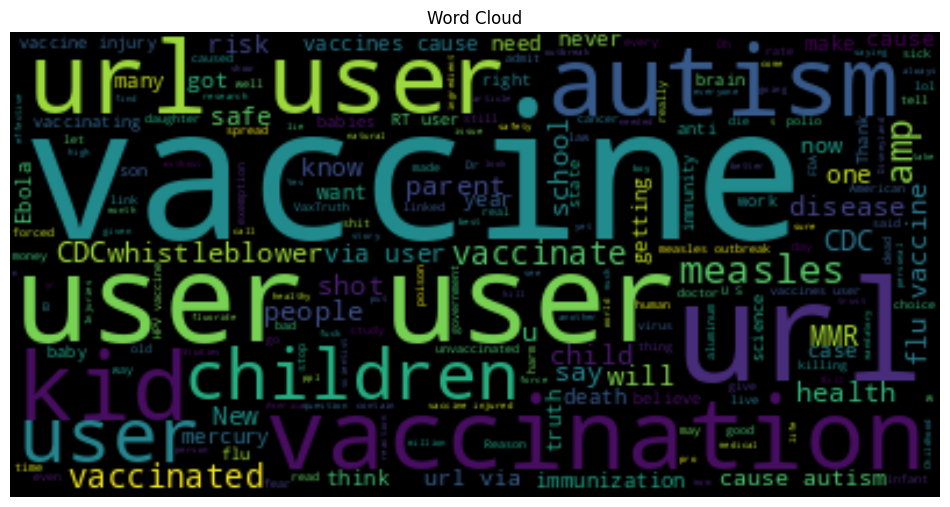

In [24]:
neg_sentence = ' '.join(negatiev['safe_text'].astype(str))

wordcloud = WordCloud().generate(neg_sentence)

# Visualize the WordCloud
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud')
plt.show()

In [25]:
import nltk

In [26]:
word_frequency = nltk.FreqDist(neutral['safe_text'].str.split().sum())
neg_words = word_frequency.most_common(10)

pd.DataFrame(neg_words)

,0,1
0,<url>,2482
1,<user>,2098
2,the,1624
3,to,1433
4,measles,1214
5,in,1008
6,of,1005
7,a,918
8,and,877
9,I,758


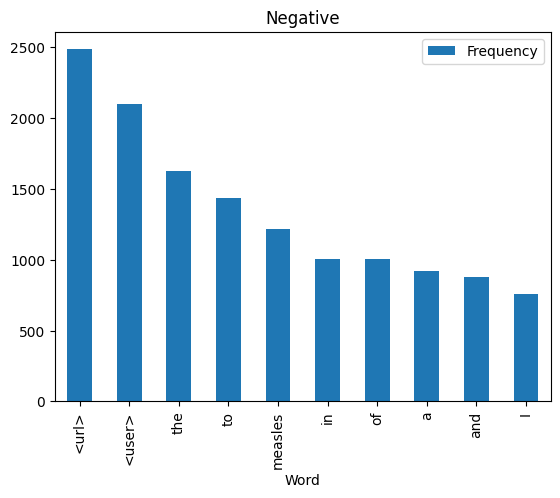

In [27]:
word_df = pd.DataFrame(neg_words, columns=['Word', 'Frequency'])
word_df.plot(x='Word', y='Frequency', kind='bar')
plt.title("Negative")
plt.show()

In [28]:
# positive

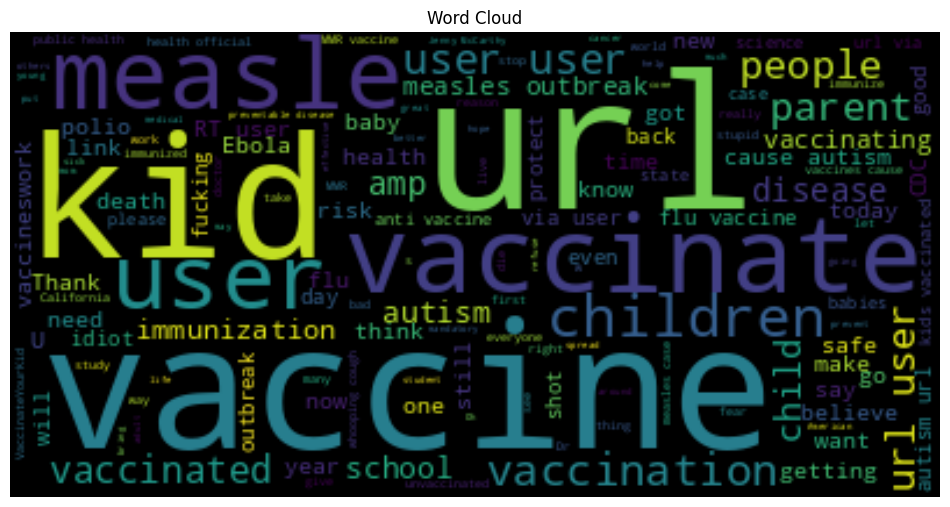

In [29]:
pos_sentence = ' '.join(positive['safe_text'].astype(str))

wordcloud = WordCloud().generate(pos_sentence)

# Visualize the WordCloud
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud')
plt.show()

In [30]:
word_frequency = nltk.FreqDist(positive['safe_text'].str.split().sum())
positive_words = word_frequency.most_common(10)

#pd.DataFrame(positive_words)

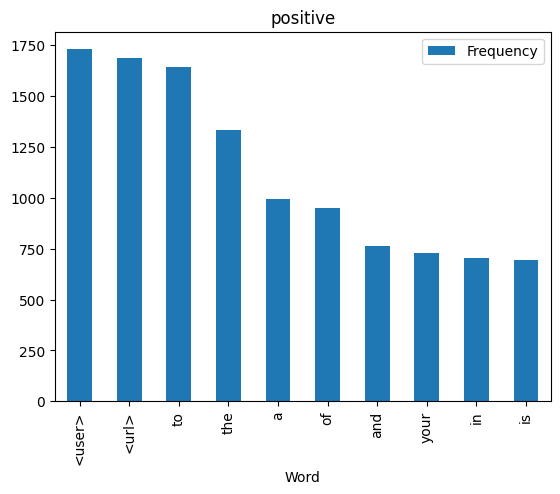

In [31]:
word_df = pd.DataFrame(positive_words, columns=['Word', 'Frequency'])
word_df.plot(x='Word', y='Frequency', kind='bar')
plt.title("positive")
plt.show()

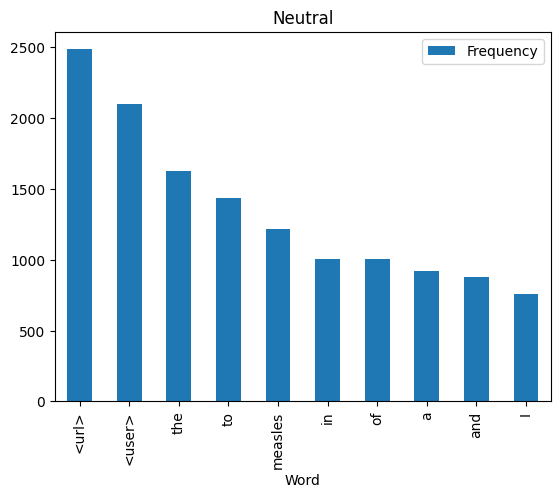

In [32]:
word_frequency = nltk.FreqDist(neutral['safe_text'].str.split().sum())
neutral_words = word_frequency.most_common(10)

#pd.DataFrame(neutral_words)

word_df = pd.DataFrame(neutral_words, columns=['Word', 'Frequency'])
word_df.plot(x='Word', y='Frequency', kind='bar')
plt.title("Neutral")
plt.show()

**FINDINGS**



*   Most words within our df are either links , user info and stopwords
*   We'll remove the stopwords, then re-visualize




In [33]:
neg = pd.DataFrame(negatiev)
p = pd.DataFrame(positive_words)
neu = pd.DataFrame(neutral_words)

In [34]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [35]:
from nltk import download
# NLTK - Natural Language Toolkit Library


# Download stopwords - Stopwords are commonly used words "a", "the" , "an", "is", "are".
# Are removed since they dont carry significant meaning to the words
download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [36]:
# import specific functions and classes from NLTK (Natural Language Toolkit library)

from nltk.tokenize import word_tokenize  # used for tokenizing text into individual words
from nltk.corpus import stopwords # provides a list of common words that are often removed from text
from nltk.stem import PorterStemmer # is a stemming algorithm that reduces words to their base or root form

# Initializes stop variable, assigns it the list of English stopwords from the NLTK corpus.
stop = stopwords.words('english')

# creates an instance of the PorterStemmer class, assigns it to the variable stemmer.
# The stemmer will be used later to perform word stemming, which reduces words to their base or root
stemmer = PorterStemmer()

In [37]:
",".join(stopwords.words('english'))

"i,me,my,myself,we,our,ours,ourselves,you,you're,you've,you'll,you'd,your,yours,yourself,yourselves,he,him,his,himself,she,she's,her,hers,herself,it,it's,its,itself,they,them,their,theirs,themselves,what,which,who,whom,this,that,that'll,these,those,am,is,are,was,were,be,been,being,have,has,had,having,do,does,did,doing,a,an,the,and,but,if,or,because,as,until,while,of,at,by,for,with,about,against,between,into,through,during,before,after,above,below,to,from,up,down,in,out,on,off,over,under,again,further,then,once,here,there,when,where,why,how,all,any,both,each,few,more,most,other,some,such,no,nor,not,only,own,same,so,than,too,very,s,t,can,will,just,don,don't,should,should've,now,d,ll,m,o,re,ve,y,ain,aren,aren't,couldn,couldn't,didn,didn't,doesn,doesn't,hadn,hadn't,hasn,hasn't,haven,haven't,isn,isn't,ma,mightn,mightn't,mustn,mustn't,needn,needn't,shan,shan't,shouldn,shouldn't,wasn,wasn't,weren,weren't,won,won't,wouldn,wouldn't"

In [38]:
stop_words = set(stopwords.words('english'))

**Since all stop words are in lower case , convert all the safetext to lower case**

In [39]:
giant_sentence

'Me &amp; The Big Homie meanboy3000 #MEANBOY #MB #MBS #MMR #STEGMANLIFE @ Stegman St. <url> I\'m 100% thinking of devoting my career to proving autism isn\'t caused by vaccines due to the IDIOTIC posts I\'ve seen about World Autism Day #whatcausesautism VACCINES, DO NOT VACCINATE YOUR CHILD I mean if they immunize my kid with something that won\'t secretly kill him years down the line then I\'m all for it, but I don\'t trust that Thanks to <user> Catch me performing at La Nuit NYC 1134 1st ave. Show starts at 6! #jennifair #mmr… <url> <user> a nearly 67 year old study when mental health studies and vaccines were relatively in their infancies that has been refuted? Study of more than 95,000 kids finds no link between MMR vaccine and autism <url> psa: VACCINATE YOUR FUCKING KIDS Coughing extra on the shuttle and everyone thinks I have the measles. 😂 #VaccinateYourKids AIDS vaccine created at Oregon Health &amp; Science University may clear virus from body - <url> <url> <user> @ this poin

In [40]:
# Remove the links

df['safe_text'] = df['safe_text'].str.replace(r'http\S+|www.\S+', '', regex=True)

In [41]:
# Remove <url> <user> @

df['safe_text'] = df['safe_text'].str.replace(r'<url>|<user>|<user>|<user>|\B@\w+', '', regex=True)

In [42]:
# Convert safe_text column to lower so as to apply stop words

df['safe_text'] = df['safe_text'].str.lower()

In [43]:
# remove stop words
def remove_stop (x):
  return ",".join([word for word in str(x).split() if word not in stop_words])


df['safe_text'] = df['safe_text'].apply(lambda x : remove_stop(x) )

In [44]:
# remove punctuation marks

df['safe_text'] = df['safe_text'].str.replace( r"[&;.,#@\!']", " ", regex=True)

In [45]:
df['safe_text']

0         amp  big homie meanboy3000  meanboy  mb  mbs ...
1        i m 100% thinking devoting career proving auti...
2               whatcausesautism vaccines  vaccinate child
3        mean immunize kid something secretly kill year...
4        thanks catch performing la nuit nyc 1134 1st a...
                               ...                        
9996     living time sperm used waste jenny mccarthy be...
9997     spite measles outbreaks  judge mi threatens pu...
9998     interesting trends child immunization oklahoma...
9999     cdc says measles highest levels decades: ( ret...
10000    pneumonia vaccine: women w risk pulmonary dise...
Name: safe_text, Length: 9999, dtype: object

**2.2 Plot a combined graph on this**

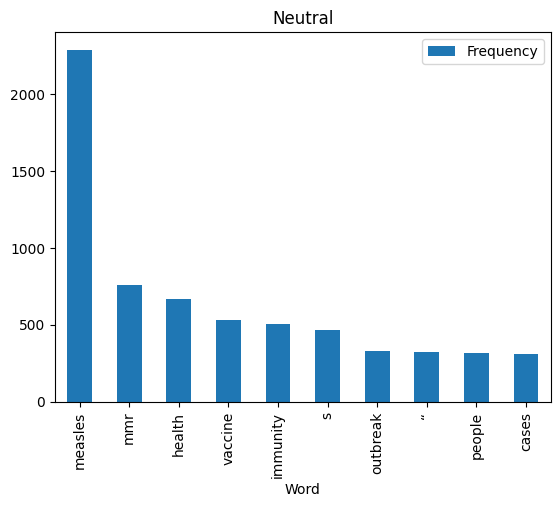

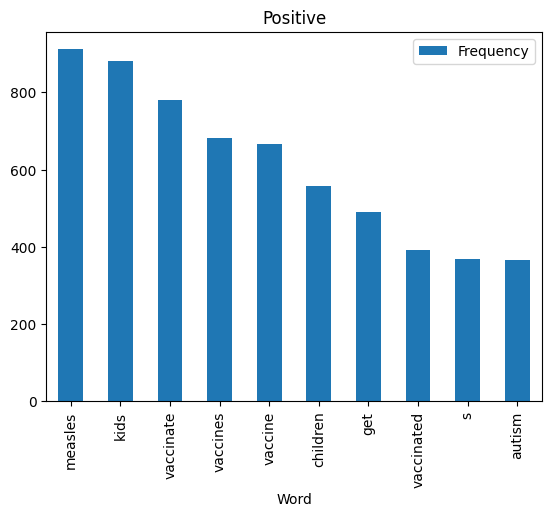

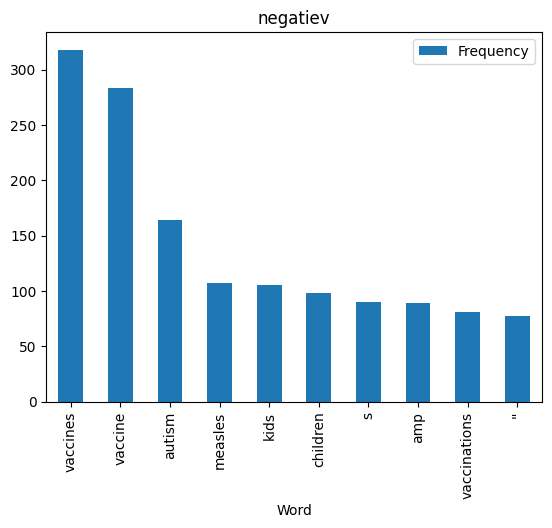

In [46]:
neutral = df[df['label']==0.0]
positive = df[df['label']==1.0]
negatiev = df[df['label']==-1.0]

word_frequency = nltk.FreqDist(neutral['safe_text'].str.split().sum())
neutral_words = word_frequency.most_common(10)
word_df = pd.DataFrame(neutral_words, columns=['Word', 'Frequency'])
word_df.plot(x='Word', y='Frequency', kind='bar')
plt.title("Neutral")
plt.show()

word_frequency = nltk.FreqDist(positive['safe_text'].str.split().sum())
neutral_words = word_frequency.most_common(10)
word_df = pd.DataFrame(neutral_words, columns=['Word', 'Frequency'])
word_df.plot(x='Word', y='Frequency', kind='bar')
plt.title("Positive")
plt.show()

word_frequency = nltk.FreqDist(negatiev['safe_text'].str.split().sum())
neutral_words = word_frequency.most_common(10)
word_df = pd.DataFrame(neutral_words, columns=['Word', 'Frequency'])
word_df.plot(x='Word', y='Frequency', kind='bar')
plt.title("negatiev")
plt.show()

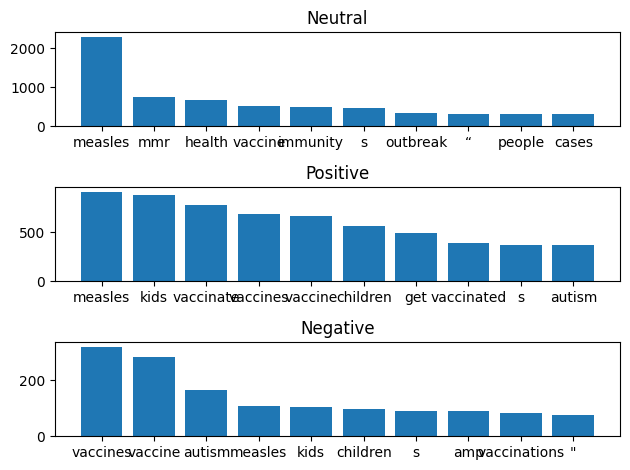

In [47]:
neutral = df[df['label'] == 0.0]
positive = df[df['label'] == 1.0]
negative = df[df['label'] == -1.0]

# Plot for Neutral
word_frequency = nltk.FreqDist(neutral['safe_text'].str.split().sum())
neutral_words = word_frequency.most_common(10)
word_df = pd.DataFrame(neutral_words, columns=['Word', 'Frequency'])

plt.subplot(3, 1, 1)
plt.bar(word_df['Word'], word_df['Frequency'])
plt.title("Neutral")

# Plot for Positive
word_frequency = nltk.FreqDist(positive['safe_text'].str.split().sum())
positive_words = word_frequency.most_common(10)
word_df = pd.DataFrame(positive_words, columns=['Word', 'Frequency'])

plt.subplot(3, 1, 2)
plt.bar(word_df['Word'], word_df['Frequency'])
plt.title("Positive")

# Plot for Negative
word_frequency = nltk.FreqDist(negative['safe_text'].str.split().sum())
negative_words = word_frequency.most_common(10)
word_df = pd.DataFrame(negative_words, columns=['Word', 'Frequency'])

plt.subplot(3, 1, 3)
plt.bar(word_df['Word'], word_df['Frequency'])
plt.title("Negative")

plt.tight_layout()
plt.show()


**2.3 Visualize emoji**

In [95]:
!pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.6/356.6 kB 7.3 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-2.6.0-py2.py3-none-any.whl size=351311 sha256=cf27f1adb5249c018b38e55b24bf878069c2bb014b3f4576f8d9321da09fda5f
  Stored in directory: /root/.cache/pip/wheels/ea/0b/64/114bc939d0083621aa41521e21be246c888260b8aa21e6c1ad
Successfully built emoji


In [48]:
from collections import Counter
#import emoji


In [53]:
# define function to get emojis

def get_emojis (giant_sentence):
  giant_sentence = " ".join(giant_sentence)
  words = word_tokenize(giant_sentence)
  emojis = [e for e in words if e in emoji.UNICODE_EMOJI['en']]
  return emojis


In [110]:
# pip uninstall emoji

Found existing installation: emoji 2.6.0
Uninstalling emoji-2.6.0:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/emoji-2.6.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/emoji/*
Proceed (Y/n)? Y
  Successfully uninstalled emoji-2.6.0


In [51]:
pip install emoji==1.7

In [52]:
from emoji import UNICODE_EMOJI

In [55]:
import emoji

In [56]:
emojis_ = get_emojis (df['safe_text'])
Counter(emojis_).items()

dict_items([('😂', 24), ('😷', 15), ('😎', 2), ('👍', 12), ('😳', 14), ('💖', 1), ('🙅', 2), ('💙', 2), ('🏫', 1), ('😠', 4), ('😐', 5), ('💥', 1), ('😒', 20), ('▶', 2), ('😍', 4), ('💯', 3), ('😊', 3), ('😭', 5), ('🖖🏻', 2), ('😿', 1), ('💋', 1), ('👀', 1), ('💁', 4), ('😔', 1), ('💉', 16), ('😬', 4), ('😱', 6), ('👊', 2), ('🙌', 10), ('✅', 3), ('👏', 3), ('😀', 1), ('👎', 3), ('😃', 3), ('☺', 2), ('😥', 4), ('💞', 1), ('😑', 7), ('💀', 1), ('🎡', 1), ('💚', 1), ('🐅', 1), ('😡', 4), ('😫', 1), ('😁', 4), ('💃', 1), ('🙎', 1), ('😉', 1), ('👿', 1), ('😪', 4), ('😏', 4), ('😈', 1), ('🙏', 4), ('👌', 1), ('✌️', 2), ('🏆', 1), ('❤️', 3), ('😟', 1), ('😺', 1), ('🎶', 1), ('😘', 2), ('🙋', 1), ('😵', 1), ('😩', 3), ('😌', 1), ('💮', 1), ('😢', 2), ('❤', 1), ('🙈', 2), ('☺️', 2), ('👉', 1), ('🏃', 1), ('🏰', 1), ('🔥', 2), ('🏥', 2), ('🍓', 2), ('🎊', 1), ('😄', 2), ('✔', 1), ('🍉', 1), ('😧', 1), ('😞', 2), ('😝', 1), ('😜', 2), ('🌀', 2), ('🐹', 1), ('‼️', 1), ('✋', 1), ('⁉️', 1), ('😕', 1), ('🙆', 1), ('☯', 1), ('🐶', 1), ('😰', 1), ('😣', 2), ('😆', 1), ('♥', 1), ('😤',

In [60]:
emoji_count = (Counter(emojis_).items())

df_emoji = pd.DataFrame(emoji_count, columns=['emoji', 'count'])

df_emoji.head()

,emoji,count
0,😂,24
1,😷,15
2,😎,2
3,👍,12
4,😳,14


In [62]:
plt.figure(figsize=(12,6))
df_emoji.head(15).sort_values(by='count', ascending=False)

,emoji,count
0,😂,24
12,😒,20
1,😷,15
4,😳,14
3,👍,12
10,😐,5
9,😠,4
14,😍,4
2,😎,2
6,🙅,2


<Figure size 1200x600 with 0 Axes>

In [55]:
# Perform preprocessing
'''1. Create "Tokens" column , to the "safe text" column in the df apply word_tokenize function
to tokenizes each text into individual words.'''
df['tokens'] = df['safe_text'].apply(lambda df: word_tokenize(df, preserve_line=True))

'''2. Create "Alpha" column , to the "token" column
applies a lambda function to the 'tokens' column, which filters out non-alphabetic words
(e.g., punctuation, numbers) and keeps only words consisting of alphabetic characters'''
df['alpha'] = df['tokens'].apply(lambda x: [item for item in x if item.isalpha()])

'''3. creates a column named 'stop' in df.
 It applies a lambda function to the 'alpha' column,
 which removes any words that are found in the stopwords list (stop).'''
df['stop'] = df['alpha'].apply(lambda x: [item for item in x if item not in stop])

'''4. creates another new column named 'stemmed' in df. It applies a lambda function to the 'stop' column,
performs word stemming using the stemmer object created earlier.
Each word in the 'stop' column is stemmed to its base or root form
'''
df['stemmed'] = df['stop'].apply(lambda x: [stemmer.stem(item) for item in x])
df.head()

,tweet_id,safe_text,label,agreement,tokens,alpha,stop,stemmed
0,CL1KWCMY,me &amp; the big homie meanboy3000 #meanboy #m...,0.0,1.0,"[me, &, amp, ;, the, big, homie, meanboy3000, ...","[me, amp, the, big, homie, meanboy, mb, mbs, m...","[amp, big, homie, meanboy, mb, mbs, mmr, stegm...","[amp, big, homi, meanboy, mb, mb, mmr, stegman..."
1,E3303EME,i'm 100% thinking of devoting my career to pro...,1.0,1.0,"[i, 'm, 100, %, thinking, of, devoting, my, ca...","[i, thinking, of, devoting, my, career, to, pr...","[thinking, devoting, career, proving, autism, ...","[think, devot, career, prove, autism, caus, va..."
2,M4IVFSMS,"#whatcausesautism vaccines, do not vaccinate y...",-1.0,1.0,"[#, whatcausesautism, vaccines, ,, do, not, va...","[whatcausesautism, vaccines, do, not, vaccinat...","[whatcausesautism, vaccines, vaccinate, child]","[whatcausesaut, vaccin, vaccin, child]"
3,1DR6ROZ4,i mean if they immunize my kid with something ...,-1.0,1.0,"[i, mean, if, they, immunize, my, kid, with, s...","[i, mean, if, they, immunize, my, kid, with, s...","[mean, immunize, kid, something, wo, secretly,...","[mean, immun, kid, someth, wo, secretli, kill,..."
4,J77ENIIE,thanks to catch me performing at la nuit nyc ...,0.0,1.0,"[thanks, to, catch, me, performing, at, la, nu...","[thanks, to, catch, me, performing, at, la, nu...","[thanks, catch, performing, la, nuit, nyc, sho...","[thank, catch, perform, la, nuit, nyc, show, s..."


In [52]:
df['safe_text']

0        me &amp; the big homie meanboy3000 #meanboy #m...
1        i'm 100% thinking of devoting my career to pro...
2        #whatcausesautism vaccines, do not vaccinate y...
3        i mean if they immunize my kid with something ...
4        thanks to  catch me performing at la nuit nyc ...
                               ...                        
9996     living in a time where the sperm i used to was...
9997        in spite of all measles outbreaks, judge in...
9998     interesting trends in child immunization in ok...
9999     cdc says measles are at highest levels in deca...
10000    pneumonia vaccine: for women w risk of pulmona...
Name: safe_text, Length: 9999, dtype: object

**2.3 Inspect the emojis**

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.6/356.6 kB 6.2 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-2.6.0-py2.py3-none-any.whl size=351311 sha256=2de88b5db89086f1f94b6fae570a659cdf5148faee684d9819742f63ca1f54a6
  Stored in directory: /root/.cache/pip/wheels/ea/0b/64/114bc939d0083621aa41521e21be246c888260b8aa21e6c1ad
Successfully built emoji


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

TypeError: ignored

In [ ]:
from collections import Counter
import emoji

def get_emojis(text):
    return [c for c in text if c in emoji.UNICODE_EMOJI['en']]

emojis_bow = []
for text in df['safe_text']:
    emojis_bow.extend(get_emojis(text))

emoji_counts = Counter(emojis_bow).items()


AttributeError: ignored

**2.4 Remove the characters and words that will not used for analysis**



*   Remove stopwords
*   Use stemming to get to the base of every word
*   <urls>, <....>, <user>, punctuation words, try retainning words beginning
    with #
*   Try separating emoji's to a different column



In [ ]:
# Download the nltk library

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

**OBSERVATIONS**

In [ ]:
import re

df['emoji'] = re.findall(df['safe_text'])

df

error: ignored

In [ ]:
import re

text = "Hello! 😊🌟 How are you? 🌈🎉"

emojis = re.findall(r'\X', text)

print(emojis)

I manually split the training set to have a training subset ( a dataset the model will learn on), and an evaluation subset ( a dataset the model with use to compute metric scores to help use to avoid some training problems like [the overfitting](https://www.ibm.com/cloud/learn/overfitting) one ).

There are multiple ways to do split the dataset. You'll see two commented line showing you another one.

In [ ]:
df.head()

,tweet_id,safe_text,label,agreement
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.0
1,E3303EME,I'm 100% thinking of devoting my career to pro...,1.0,1.0
2,M4IVFSMS,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,1.0
3,1DR6ROZ4,I mean if they immunize my kid with something ...,-1.0,1.0
4,J77ENIIE,Thanks to <user> Catch me performing at La Nui...,0.0,1.0


In [ ]:
# Split the train data => {train, eval}
train, eval = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

In [ ]:
train.head()

,tweet_id,safe_text,label,agreement
9305,YMRMEDME,Mickey's Measles has gone international <url>,0.0,1.000000
3907,5GV8NEZS,S1256 [NEW] Extends exemption from charitable ...,0.0,1.000000
795,EI10PS46,<user> your ignorance on vaccines isn't just ...,1.0,0.666667
5793,OM26E6DG,Pakistan partly suspends polio vaccination pro...,0.0,1.000000
3431,NBBY86FX,In other news I've gone up like 1000 mmr,0.0,1.000000


In [ ]:
eval.head()

,tweet_id,safe_text,label,agreement
6571,R7JPIFN7,Children's Museum of Houston to Offer Free Vac...,1.0,1.000000
1754,2DD250VN,<user> no. I was properly immunized prior to t...,1.0,1.000000
3325,ESEVBTFN,<user> thx for posting vaccinations are impera...,1.0,1.000000
1485,S17ZU0LC,This Baby Is Exactly Why Everyone Needs To Vac...,1.0,0.666667
4175,IIN5D33V,"Meeting tonight, 8:30pm in room 322 of the stu...",1.0,1.000000


In [ ]:
print(f"new dataframe shapes: train is {train.shape}, eval is {eval.shape}")

new dataframe shapes: train is (7999, 4), eval is (2000, 4)


In [ ]:
# Create the 'LP5 datasets' directory to store Train and Eval
if not os.path.exists('LP5 datasets'):
    os.makedirs('LP5 datasets')

In [ ]:
# Save the datasets
train.to_csv("./LP5 datasets/train_subset.csv", index=False)
eval.to_csv("./LP5 datasets/eval_subset.csv", index=False)


In [ ]:
# using the load_dataset function to load CSV files as datasets
dataset = load_dataset('csv',
                       data_files={'train': './LP5 datasets/train_subset.csv',
                                   'eval': './LP5 datasets/eval_subset.csv'},
                       encoding="ISO-8859-1")


Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating eval split: 0 examples [00:00, ? examples/s]

Dataset csv downloaded and prepared to /root/.cache/huggingface/datasets/csv/default-72b300d49775e5a6/0.0.0/eea64c71ca8b46dd3f537ed218fc9bf495d5707789152eb2764f5c78fa66d59d. Subsequent calls will reuse this data.


  0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
from transformers import AutoTokenizer

# creates an instance of the AutoTokenizer class using the .from_pretrained method
# from_pretrained method is used to load a pre-trained tokenizer from the HuggingFace
# bert-base-cased model is a model in HuggingFace
# .from_pretrained function
tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')

In [ ]:
# 0 , 1, -1

'''
-1 = Negative sentiment
0 = Neutral Sentiment
1 = Positive Sentiment
'''

def transform_labels(label):

    label = label['label']  # extracts the value of the 'label'  from the label input
    num = 0
    if label == -1: #'Negative'
        num = 0
    elif label == 0: #'Neutral'
        num = 1
    elif label == 1: #'Positive'
        num = 2

    return {'labels': num}

In [ ]:
df

,tweet_id,safe_text,label,agreement
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.000000
1,E3303EME,I'm 100% thinking of devoting my career to pro...,1.0,1.000000
2,M4IVFSMS,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,1.000000
3,1DR6ROZ4,I mean if they immunize my kid with something ...,-1.0,1.000000
4,J77ENIIE,Thanks to <user> Catch me performing at La Nui...,0.0,1.000000
...,...,...,...,...
9996,IU0TIJDI,Living in a time where the sperm I used to was...,1.0,1.000000
9997,WKKPCJY6,<user> <user> In spite of all measles outbrea...,1.0,0.666667
9998,ST3A265H,Interesting trends in child immunization in Ok...,0.0,1.000000
9999,6Z27IJGD,CDC Says Measles Are At Highest Levels In Deca...,0.0,1.000000


In [ ]:
train.head()

,tweet_id,safe_text,label,agreement
9305,YMRMEDME,Mickey's Measles has gone international <url>,0.0,1.000000
3907,5GV8NEZS,S1256 [NEW] Extends exemption from charitable ...,0.0,1.000000
795,EI10PS46,<user> your ignorance on vaccines isn't just ...,1.0,0.666667
5793,OM26E6DG,Pakistan partly suspends polio vaccination pro...,0.0,1.000000
3431,NBBY86FX,In other news I've gone up like 1000 mmr,0.0,1.000000


In [ ]:
eval.head()

,tweet_id,safe_text,label,agreement
6571,R7JPIFN7,Children's Museum of Houston to Offer Free Vac...,1.0,1.000000
1754,2DD250VN,<user> no. I was properly immunized prior to t...,1.0,1.000000
3325,ESEVBTFN,<user> thx for posting vaccinations are impera...,1.0,1.000000
1485,S17ZU0LC,This Baby Is Exactly Why Everyone Needs To Vac...,1.0,0.666667
4175,IIN5D33V,"Meeting tonight, 8:30pm in room 322 of the stu...",1.0,1.000000


# WEEK 1 TASK

Our task for this week is to understand the core concepts of the project by exploring the provided curated materials, then to start to setup your environment, to fine-tune your first pre-trained model and to push it to Hugging Face through your notebook.

While focusing on the safe_text column , For week 1 we will use a pretrained model from hugging face.  

In [ ]:
df['label'].value_counts()

 0.0    4908
 1.0    4053
-1.0    1038
Name: label, dtype: int64

In [ ]:
import plotly.express as px

# Calculate the value counts and sort by index
label_counts = df['label'].value_counts().sort_index()

# Create the bar chart using Plotly Express
fig = px.bar(
    x=label_counts.index,  # X-axis: sentiment labels
    y=label_counts.values,  # Y-axis: count of each sentiment label
    title="Plotting the Average Sentiments on Our Dataset"
)

# Show the plot
fig.show()


In [ ]:
df[['safe_text', 'label']][:10]

,safe_text,label
0,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0
1,I'm 100% thinking of devoting my career to pro...,1.0
2,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0
3,I mean if they immunize my kid with something ...,-1.0
4,Thanks to <user> Catch me performing at La Nui...,0.0
5,<user> a nearly 67 year old study when mental ...,1.0
6,"Study of more than 95,000 kids finds no link b...",1.0
7,psa: VACCINATE YOUR FUCKING KIDS,1.0
8,Coughing extra on the shuttle and everyone thi...,1.0
9,AIDS vaccine created at Oregon Health &amp; Sc...,1.0


In [ ]:
'''
It is hard to inspect
'''

'\nIt is hard to inspect \n'

In [ ]:
from nltk import download
# NLTK - Natural Language Toolkit Library


# Download stopwords - Stopwords are commonly used words "a", "the" , "an", "is", "are".
# Are removed since they dont carry significant meaning to the words
download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# import specific functions and classes from NLTK (Natural Language Toolkit library)

from nltk.tokenize import word_tokenize  # used for tokenizing text into individual words
from nltk.corpus import stopwords # provides a list of common words that are often removed from text
from nltk.stem import PorterStemmer # is a stemming algorithm that reduces words to their base or root form

# Initializes stop variable, assigns it the list of English stopwords from the NLTK corpus.
stop = stopwords.words('english')

# creates an instance of the PorterStemmer class, assigns it to the variable stemmer.
# The stemmer will be used later to perform word stemming, which reduces words to their base or root
stemmer = PorterStemmer()

# Perform preprocessing
'''1. Create "Tokens" column , to the "safe text" column in the df apply word_tokenize function
to tokenizes each text into individual words.'''
df['tokens'] = df['safe_text'].apply(lambda df: word_tokenize(df, preserve_line=True))

'''2. Create "Alpha" column , to the "token" column
applies a lambda function to the 'tokens' column, which filters out non-alphabetic words
(e.g., punctuation, numbers) and keeps only words consisting of alphabetic characters'''
df['alpha'] = df['tokens'].apply(lambda x: [item for item in x if item.isalpha()])

'''3. creates a column named 'stop' in df.
 It applies a lambda function to the 'alpha' column,
 which removes any words that are found in the stopwords list (stop).'''
df['stop'] = df['alpha'].apply(lambda x: [item for item in x if item not in stop])

'''4. creates another new column named 'stemmed' in df. It applies a lambda function to the 'stop' column,
performs word stemming using the stemmer object created earlier.
Each word in the 'stop' column is stemmed to its base or root form
'''
df['stemmed'] = df['stop'].apply(lambda x: [stemmer.stem(item) for item in x])
df.head()

,tweet_id,safe_text,label,agreement,tokens,alpha,stop,stemmed
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.0,"[Me, &, amp, ;, The, Big, Homie, meanboy3000, ...","[Me, amp, The, Big, Homie, MEANBOY, MB, MBS, M...","[Me, amp, The, Big, Homie, MEANBOY, MB, MBS, M...","[me, amp, the, big, homi, meanboy, mb, mb, mmr..."
1,E3303EME,I'm 100% thinking of devoting my career to pro...,1.0,1.0,"[I, 'm, 100, %, thinking, of, devoting, my, ca...","[I, thinking, of, devoting, my, career, to, pr...","[I, thinking, devoting, career, proving, autis...","[i, think, devot, career, prove, autism, caus,..."
2,M4IVFSMS,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,1.0,"[#, whatcausesautism, VACCINES, ,, DO, NOT, VA...","[whatcausesautism, VACCINES, DO, NOT, VACCINAT...","[whatcausesautism, VACCINES, DO, NOT, VACCINAT...","[whatcausesaut, vaccin, do, not, vaccin, your,..."
3,1DR6ROZ4,I mean if they immunize my kid with something ...,-1.0,1.0,"[I, mean, if, they, immunize, my, kid, with, s...","[I, mean, if, they, immunize, my, kid, with, s...","[I, mean, immunize, kid, something, wo, secret...","[i, mean, immun, kid, someth, wo, secretli, ki..."
4,J77ENIIE,Thanks to <user> Catch me performing at La Nui...,0.0,1.0,"[Thanks, to, <, user, >, Catch, me, performing...","[Thanks, to, user, Catch, me, performing, at, ...","[Thanks, user, Catch, performing, La, Nuit, NY...","[thank, user, catch, perform, la, nuit, nyc, s..."


In [ ]:
df[['safe_text', 'label', 'alpha']][:10].head()

,safe_text,label,alpha
0,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,"[Me, amp, The, Big, Homie, MEANBOY, MB, MBS, M..."
1,I'm 100% thinking of devoting my career to pro...,1.0,"[I, thinking, of, devoting, my, career, to, pr..."
2,"#whatcausesautism VACCINES, DO NOT VACCINATE Y...",-1.0,"[whatcausesautism, VACCINES, DO, NOT, VACCINAT..."
3,I mean if they immunize my kid with something ...,-1.0,"[I, mean, if, they, immunize, my, kid, with, s..."
4,Thanks to <user> Catch me performing at La Nui...,0.0,"[Thanks, to, user, Catch, me, performing, at, ..."


# MODEL 1

### Model Name - ProsusAI / finbert

**Text Classification** - Uses transfer learning since the model was trained on pre-trained NLP model to analyze sentiment of financial text. It is built by further training the BERT language model in the finance domain, using a large financial corpus and thereby fine-tuning it for financial sentiment classification.

**Reason for selection** - The model gives softmax outputs for three labels: positive, negative or neutral.

Easier to fine tune tha the others

Wanted to transfer learning

In [ ]:
# Loading using a pipeline
from transformers import pipeline

pipe = pipeline("text-classification", model="ProsusAI/finbert")

In [ ]:
train

,tweet_id,safe_text,label,agreement
9305,YMRMEDME,Mickey's Measles has gone international <url>,0.0,1.0
3907,5GV8NEZS,S1256 [NEW] Extends exemption from charitable ...,0.0,1.0


In [ ]:
X_train = train['safe_text']

X_train.head()

9305        Mickey's Measles has gone international <url>
3907    S1256 [NEW] Extends exemption from charitable ...
795     <user>  your ignorance on vaccines isn't just ...
5793    Pakistan partly suspends polio vaccination pro...
3431             In other news I've gone up like 1000 mmr
Name: safe_text, dtype: object

In [ ]:
eval

,tweet_id,safe_text,label,agreement
6571,R7JPIFN7,Children's Museum of Houston to Offer Free Vac...,1.0,1.000000
1754,2DD250VN,<user> no. I was properly immunized prior to t...,1.0,1.000000
3325,ESEVBTFN,<user> thx for posting vaccinations are impera...,1.0,1.000000
1485,S17ZU0LC,This Baby Is Exactly Why Everyone Needs To Vac...,1.0,0.666667
4175,IIN5D33V,"Meeting tonight, 8:30pm in room 322 of the stu...",1.0,1.000000
...,...,...,...,...
3219,J7IQVE6X,<user> Is Imus really telling people to chill ...,0.0,0.666667
2080,ICX9AF8Y,"After overseas trip, Wake resident could have ...",0.0,1.000000
8111,C9TSI9HK,How many kids at a school aren't immunized? Pl...,0.0,1.000000
9729,ZR5J41GP,Come &amp; Celebrate <user> #goodtime #mmr #dc...,0.0,0.666667


Call the tokenizer

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")

In [ ]:
train_encoded = tokenizer(X_train.tolist(), truncation=True, padding=True)
test_encoded = tokenizer(eval['safe_text'].tolist(), truncation=True, padding=True)


In [ ]:
train_encoded

{'input_ids': [[101, 11021, 1005, 1055, 2033, 3022, 4244, 2038, 2908, 2248, 1026, 24471, 2140, 1028, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1055, 12521, 26976, 1031, 2047, 1033, 8908, 19621, 2013, 11128, 15403, 2005, 3056, 2942, 4506, 2000, 5381, 1997, 2151, 2287, 2040, 2024, 2022, 1012, 1012, 1012, 1026, 24471, 2140, 1028, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1026, 5310, 1028, 2115, 18173, 2006, 28896, 3475, 1005, 1056, 2074, 4795, 2000, 2115, 7036, 2775, 2021, 2000, 2500, 2105, 2017, 1012, 9467, 2006, 2017, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 4501, 6576, 28324, 2015, 14955, 3695, 12436, 14693, 9323, 2565, 2044, 15554, 3

In [ ]:
test_encoded

{'input_ids': [[101, 2336, 1005, 1055, 2688, 1997, 5395, 2000, 3749, 2489, 12436, 14693, 9323, 2015, 1026, 24471, 2140, 1028, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1026, 5310, 1028, 2053, 1012, 1045, 2001, 7919, 10047, 23041, 3550, 3188, 2000, 1996, 2836, 1012, 1996, 4845, 8509, 2006, 1037, 4190, 4183, 2265, 1045, 2097, 2360, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1026, 5310, 1028, 16215, 2595, 2005, 14739, 12436, 14693, 9323, 2015, 2024, 23934, 1012, 1037, 6203, 17022, 1045, 2113, 2351, 1997, 11968, 6767, 1010, 1037, 6659, 2331, 1012, 4286, 7968, 2039, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 2023, 3336, 2003, 3599, 2339, 3071

In [ ]:
import tensorflow as tf

In [ ]:
df.head(1)

,tweet_id,safe_text,label,agreement,tokens,alpha,stop,stemmed
0,CL1KWCMY,Me &amp; The Big Homie meanboy3000 #MEANBOY #M...,0.0,1.0,"[Me, &, amp, ;, The, Big, Homie, meanboy3000, ...","[Me, amp, The, Big, Homie, MEANBOY, MB, MBS, M...","[Me, amp, The, Big, Homie, MEANBOY, MB, MBS, M...","[me, amp, the, big, homi, meanboy, mb, mb, mmr..."


In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices ((
    dict(train_encoded),
    df['label'][:7999]
))

test_dataset = tf.data.Dataset.from_tensor_slices ((
    dict(test_encoded),
    df['label'][:2000]
))

In [ ]:
train_dataset

<_TensorSliceDataset element_spec=({'input_ids': TensorSpec(shape=(76,), dtype=tf.int32, name=None), 'token_type_ids': TensorSpec(shape=(76,), dtype=tf.int32, name=None), 'attention_mask': TensorSpec(shape=(76,), dtype=tf.int32, name=None)}, TensorSpec(shape=(), dtype=tf.float64, name=None))>

In [ ]:
test_dataset

<_TensorSliceDataset element_spec=({'input_ids': TensorSpec(shape=(76,), dtype=tf.int32, name=None), 'token_type_ids': TensorSpec(shape=(76,), dtype=tf.int32, name=None), 'attention_mask': TensorSpec(shape=(76,), dtype=tf.int32, name=None)}, TensorSpec(shape=(), dtype=tf.float64, name=None))>

In [ ]:
from transformers import TFDistilBertForSequenceClassification , TFTrainer , TFTrainingArguments

training_args = TFTrainingArguments (
    output_dir='./results',
    num_train_epochs=2,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,

)

Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModelForSequenceClassification

tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")
model = AutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert")

In [ ]:
with training_args.strategy.scope():
  model = AutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert")

trainer = TFTrainer (
    model = model,
    args= training_args,
    train_dataset=train_dataset,
    eval_dataset=train_dataset,
)

trainer.train

Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


<bound method TFTrainer.train of <transformers.trainer_tf.TFTrainer object at 0x7fd89102bfa0>>

In [ ]:
trainer.evaluate(test_dataset)

TypeError: ignored

In [ ]:
eval.head(2)

,tweet_id,safe_text,label,agreement
6571,R7JPIFN7,Children's Museum of Houston to Offer Free Vac...,1.0,1.0
1754,2DD250VN,<user> no. I was properly immunized prior to t...,1.0,1.0


In [ ]:
def tokenize_data(example):
     return tokenizer(example['safe_text'], padding='max_length')
#    return tokenizer(example, padding='max_length')

# Change the tweets to tokens that the models can exploit
dataset = dataset.map(tokenize_data, batched=True)

# Transform	labels and remove the useless columns
remove_columns = ['tweet_id', 'label', 'safe_text', 'agreement']
dataset = dataset.map(transform_labels, remove_columns=remove_columns)

Map:   0%|          | 0/7999 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/7999 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['input_ids', 'token_type_ids', 'attention_mask', 'labels'],
        num_rows: 7999
    })
    eval: Dataset({
        features: ['input_ids', 'token_type_ids', 'attention_mask', 'labels'],
        num_rows: 2000
    })
})

In [ ]:
dataset['train']

Dataset({
    features: ['input_ids', 'token_type_ids', 'attention_mask', 'labels'],
    num_rows: 7999
})

In [ ]:
from transformers import TrainingArguments

# Configure the trianing parameters like `num_train_epochs`:
# the number of time the model will repeat the training loop over the dataset
training_args = TrainingArguments("test_trainer", num_train_epochs=3000, load_best_model_at_end=True,)

ValueError: ignored

In [ ]:
from transformers import AutoModelForSequenceClassification

# Loading a pretrain model while specifying the number of labels in our dataset for fine-tuning
model = AutoModelForSequenceClassification.from_pretrained("bert-base-cased", num_labels=3)

In [ ]:
train_dataset = dataset['train'].shuffle(seed=10) #.select(range(40000)) # to select a part
eval_dataset = dataset['eval'].shuffle(seed=10)

## other way to split the train set ... in the range you must use:
# # int(num_rows*.8 ) for [0 - 80%] and  int(num_rows*.8 ),num_rows for the 20% ([80 - 100%])
# train_dataset = dataset['train'].shuffle(seed=10).select(range(40000))
# eval_dataset = dataset['train'].shuffle(seed=10).select(range(40000, 41000))

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model, args=training_args, train_dataset=train_dataset, eval_dataset=eval_dataset
)

In [ ]:
# Launch the learning process: training
trainer.train()

Don't worry the above issue, it is a `KeyboardInterrupt` that means I stopped the training to avoid taking a long time to finish.

In [ ]:
import numpy as np
from datasets import load_metric

metric = load_metric("accuracy")

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    compute_metrics=compute_metrics,
)

In [ ]:
# Launch the final evaluation
trainer.evaluate()

Some checkpoints of the model are automatically saved locally in `test_trainer/` during the training.

You may also upload the model on the Hugging Face Platform... [Read more](https://huggingface.co/docs/hub/models-uploading)

This notebook is inspired by an article: [Fine-Tuning Bert for Tweets Classification ft. Hugging Face](https://medium.com/mlearning-ai/fine-tuning-bert-for-tweets-classification-ft-hugging-face-8afebadd5dbf)

Do not hesitaite to read more and to ask questions, the Learning is a lifelong activity.